# Librerias y datos

In [ ]:
import os
import numpy as np
from skimage.io import imread, imshow
from skimage.transform import resize
import matplotlib.pyplot as plt
from tqdm import tqdm
import zipfile
import random
from google.colab import drive
import tensorflow as tf

In [ ]:
# Habilitar google drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from tensorflow.keras.callbacks import TensorBoard
#Cargar la extension de tensorboard de colab
%load_ext tensorboard

In [ ]:
#Ejecutar tensorboard e indicarle que lea la carpeta "logs"
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

# Leer datos de entrenamiento

In [ ]:
import os
import cv2
from tqdm import tqdm

# Ruta base
ruta_train = '/content/drive/MyDrive/TESIS/data/train'
clases = ['pandereta', 'macizo']  # 0: pandereta, 1: macizo

# Diccionario final
datos = {'train': []}

for etiqueta, clase in enumerate(clases):
    ruta_clase = os.path.join(ruta_train, clase)
    for nombre_archivo in tqdm(os.listdir(ruta_clase), desc=f'Train - {clase}'):
        ruta_img = os.path.join(ruta_clase, nombre_archivo)
        try:
            img = cv2.imread(ruta_img)  # Se carga en color tal cual
            if img is not None:
                datos['train'].append((img, etiqueta))  # imagen original + etiqueta
            else:
                print(f'⚠️ Imagen no cargada: {ruta_img}')
        except:
            print(f'❌ Error al leer: {ruta_img}')


Train - pandereta:   1%|          | 1/101 [00:00<01:32,  1.08it/s]

⚠️ Imagen no cargada: /content/drive/MyDrive/TESIS/data/train/pandereta/desktop.ini


Train - macizo: 100%|██████████| 100/100 [01:16<00:00,  1.31it/s]


In [ ]:
import random
random.seed(42)
random.shuffle(datos['train'])

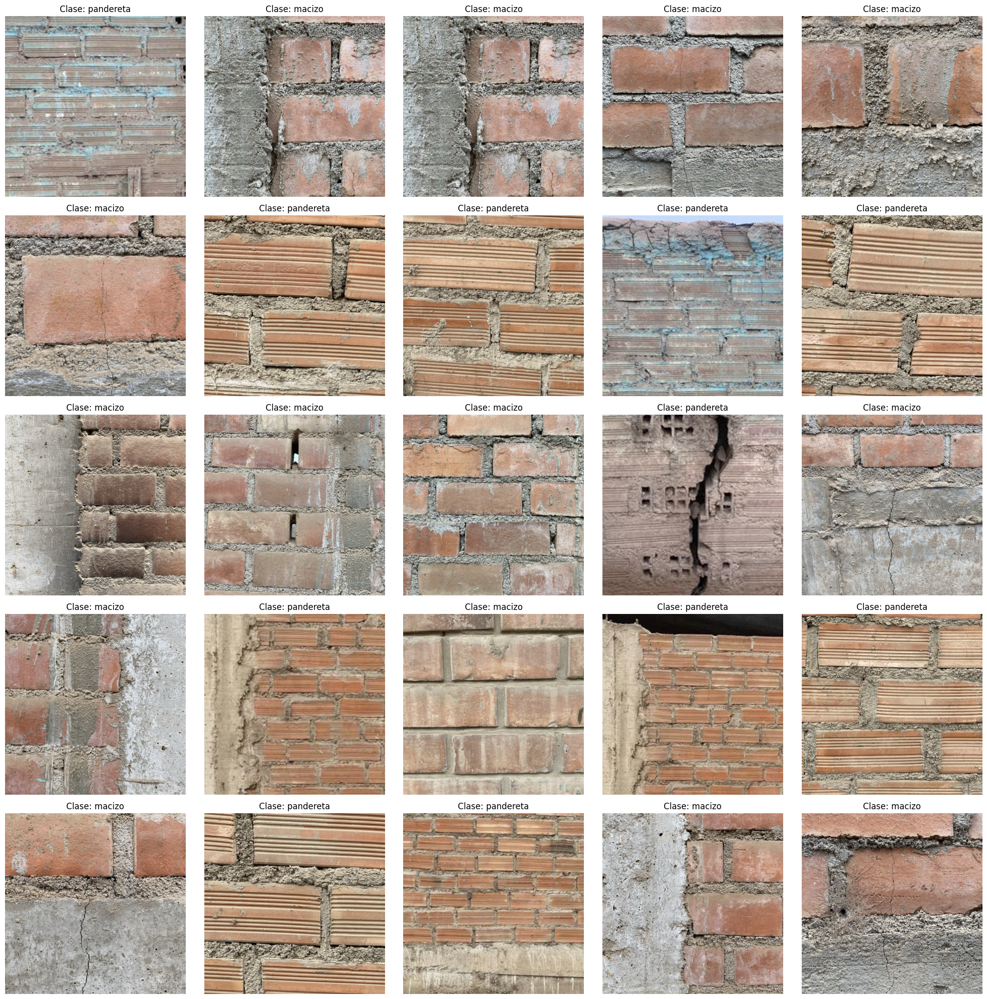

In [ ]:
import matplotlib.pyplot as plt
import cv2

# Texto para cada etiqueta
etiquetas_texto = ['pandereta', 'macizo']

plt.figure(figsize=(20, 20))
for i, (imagen, etiqueta) in enumerate(datos['train'][:25]):
    imagen = cv2.resize(imagen, (512, 512))
    imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2RGB)
    plt.subplot(5, 5, i + 1)
    plt.imshow(imagen)
    plt.title(f'Clase: {etiquetas_texto[etiqueta]}', fontsize=12)
    plt.axis('off')

plt.tight_layout()
plt.show()


# Separar imagenes y máscaras

In [ ]:
ALTO = 128
ANCHO = 128

In [ ]:
datos_entrenamiento = []

In [ ]:
for i, (imagen, etiqueta) in enumerate(datos['train']): #Todos los datos
  imagen = cv2.resize(imagen, (ALTO, ANCHO))
  imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
  imagen = imagen.reshape(ALTO, ANCHO, 1) #Cambiar tamano a 100,100,1
  datos_entrenamiento.append([imagen, etiqueta])

In [ ]:
#Ver los datos del primer indice
datos_entrenamiento[0]

[array([[[148],
         [142],
         [145],
         ...,
         [145],
         [120],
         [104]],
 
        [[160],
         [156],
         [164],
         ...,
         [122],
         [110],
         [ 20]],
 
        [[169],
         [167],
         [172],
         ...,
         [121],
         [140],
         [ 96]],
 
        ...,
 
        [[191],
         [183],
         [179],
         ...,
         [139],
         [135],
         [ 42]],
 
        [[185],
         [177],
         [182],
         ...,
         [141],
         [155],
         [ 59]],
 
        [[191],
         [190],
         [186],
         ...,
         [138],
         [148],
         [100]]], dtype=uint8),
 0]

In [ ]:
#Ver cuantos datos tengo en la variable
len(datos_entrenamiento)

200

In [ ]:
#Preparar mis variables X (entradas) y y (etiquetas) separadas

X = [] #imagenes de entrada (pixeles)
y = [] #etiquetas (perro o gato)

for imagen, etiqueta in datos_entrenamiento:
  X.append(imagen)
  y.append(etiqueta)

In [ ]:
#Normalizar los datos de las X (imagenes). Se pasan a numero flotante y dividen entre 255 para quedar de 0-1 en lugar de 0-255
import numpy as np

X = np.array(X).astype(float) / 255

In [ ]:
#Convertir etiquetas en arreglo simple
y = np.array(y)

In [ ]:
X.shape

(200, 128, 128, 1)

# Modelo Sin Aumento de Datos

In [ ]:
modeloCNN = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(ALTO, ANCHO, 1)),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),

  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(100, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
#Compilar modelos. Usar crossentropy binario ya que tenemos solo 2 opciones (perro o gato)

modeloCNN.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint

tensorboardCNN = TensorBoard(log_dir='logs/cnn')

# Callback para guardar el mejor modelo según val_accuracy
checkpoint = ModelCheckpoint('clasificador_superficie_SA.h5',
                             monitor='val_loss',
                             save_best_only=True,
                             mode='min',
                             verbose=1)

historial1 = modeloCNN.fit(X, y,
                          batch_size=32,
                          validation_split=0.15,
                          epochs=150,
                          callbacks=[tensorboardCNN, checkpoint])

Epoch 1/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step - accuracy: 0.4951 - loss: 0.7901
Epoch 1: val_loss improved from inf to 0.69353, saving model to clasificador_superficie_SA.h5


6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 444ms/step - accuracy: 0.4966 - loss: 0.7867 - val_accuracy: 0.5000 - val_loss: 0.6935
Epoch 2/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.5312 - loss: 0.6901
Epoch 2: val_loss improved from 0.69353 to 0.69077, saving model to clasificador_superficie_SA.h5


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - accuracy: 0.5247 - loss: 0.6909 - val_accuracy: 0.5000 - val_loss: 0.6908
Epoch 3/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.6562 - loss: 0.6833
Epoch 3: val_loss improved from 0.69077 to 0.69072, saving model to clasificador_superficie_SA.h5


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - accuracy: 0.5542 - loss: 0.6920 - val_accuracy: 0.5000 - val_loss: 0.6907
Epoch 4/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.3438 - loss: 0.6986
Epoch 4: val_loss improved from 0.69072 to 0.68649, saving model to clasificador_superficie_SA.h5


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - accuracy: 0.4231 - loss: 0.6967 - val_accuracy: 0.5000 - val_loss: 0.6865
Epoch 5/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.4375 - loss: 0.6883
Epoch 5: val_loss improved from 0.68649 to 0.67259, saving model to clasificador_superficie_SA.h5


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - accuracy: 0.4976 - loss: 0.6841 - val_accuracy: 0.5000 - val_loss: 0.6726
Epoch 6/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.5312 - loss: 0.6645
Epoch 6: val_loss improved from 0.67259 to 0.61507, saving model to clasificador_superficie_SA.h5


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - accuracy: 0.6108 - loss: 0.6563 - val_accuracy: 0.6333 - val_loss: 0.6151
Epoch 7/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.6875 - loss: 0.5996
Epoch 7: val_loss improved from 0.61507 to 0.55551, saving model to clasificador_superficie_SA.h5


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - accuracy: 0.6748 - loss: 0.6145 - val_accuracy: 0.8333 - val_loss: 0.5555
Epoch 8/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.7500 - loss: 0.5808
Epoch 8: val_loss did not improve from 0.55551
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.7701 - loss: 0.5410 - val_accuracy: 0.6333 - val_loss: 0.6234
Epoch 9/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.7500 - loss: 0.5658
Epoch 9: val_loss improved from 0.55551 to 0.45426, saving model to clasificador_superficie_SA.h5


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - accuracy: 0.6813 - loss: 0.6217 - val_accuracy: 0.8333 - val_loss: 0.4543
Epoch 10/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.7500 - loss: 0.5091
Epoch 10: val_loss improved from 0.45426 to 0.40497, saving model to clasificador_superficie_SA.h5


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - accuracy: 0.7380 - loss: 0.5147 - val_accuracy: 0.8333 - val_loss: 0.4050
Epoch 11/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.9375 - loss: 0.3396
Epoch 11: val_loss improved from 0.40497 to 0.38405, saving model to clasificador_superficie_SA.h5


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - accuracy: 0.8317 - loss: 0.4261 - val_accuracy: 0.9000 - val_loss: 0.3841
Epoch 12/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.8438 - loss: 0.4187
Epoch 12: val_loss did not improve from 0.38405
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - accuracy: 0.8686 - loss: 0.3666 - val_accuracy: 0.7000 - val_loss: 0.5044
Epoch 13/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.7500 - loss: 0.4609
Epoch 13: val_loss improved from 0.38405 to 0.25540, saving model to clasificador_superficie_SA.h5


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - accuracy: 0.8382 - loss: 0.3751 - val_accuracy: 0.9000 - val_loss: 0.2554
Epoch 14/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.9688 - loss: 0.2051
Epoch 14: val_loss did not improve from 0.25540
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.9282 - loss: 0.2408 - val_accuracy: 0.8667 - val_loss: 0.2611
Epoch 15/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.9375 - loss: 0.1557
Epoch 15: val_loss did not improve from 0.25540
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.8331 - loss: 0.4211 - val_accuracy: 0.7000 - val_loss: 0.5021
Epoch 16/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.7812 - loss: 0.4354
Epoch 16: val_loss improved from 0.25540 to 0.21557, saving model to clasificador_superficie_SA.h5


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.8387 - loss: 0.3528 - val_accuracy: 0.9667 - val_loss: 0.2156
Epoch 17/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 1.0000 - loss: 0.1755
Epoch 17: val_loss did not improve from 0.21557
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - accuracy: 0.9032 - loss: 0.2732 - val_accuracy: 0.9333 - val_loss: 0.2672
Epoch 18/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.6250 - loss: 0.5349
Epoch 18: val_loss did not improve from 0.21557
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.8361 - loss: 0.3183 - val_accuracy: 0.9000 - val_loss: 0.2497
Epoch 19/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 1.0000 - loss: 0.1161
Epoch 19: val_loss improved from 0.21557 to 0.09401, saving model to clasificador_superficie_SA.h5


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - accuracy: 0.9923 - loss: 0.1251 - val_accuracy: 0.9667 - val_loss: 0.0940
Epoch 20/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.9688 - loss: 0.1511
Epoch 20: val_loss improved from 0.09401 to 0.05880, saving model to clasificador_superficie_SA.h5


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - accuracy: 0.9856 - loss: 0.1081 - val_accuracy: 1.0000 - val_loss: 0.0588
Epoch 21/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.9688 - loss: 0.0603
Epoch 21: val_loss did not improve from 0.05880
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - accuracy: 0.9790 - loss: 0.0572 - val_accuracy: 0.9333 - val_loss: 0.1398
Epoch 22/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 1.0000 - loss: 0.0294
Epoch 22: val_loss improved from 0.05880 to 0.04048, saving model to clasificador_superficie_SA.h5


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - accuracy: 0.9895 - loss: 0.0498 - val_accuracy: 1.0000 - val_loss: 0.0405
Epoch 23/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.9688 - loss: 0.1075
Epoch 23: val_loss did not improve from 0.04048
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.9385 - loss: 0.1338 - val_accuracy: 1.0000 - val_loss: 0.0485
Epoch 24/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.9688 - loss: 0.0564
Epoch 24: val_loss did not improve from 0.04048
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - accuracy: 0.9753 - loss: 0.0697 - val_accuracy: 0.8667 - val_loss: 0.2891
Epoch 25/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.8750 - loss: 0.2439
Epoch 25: val_loss did not improve from 0.04048
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.9018 - loss: 0.1832 - val_accuracy: 1.0000 - val_loss: 0.0655
Epoch 26/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 1.0000 - loss: 0.0483
Epoch 26: val_loss did not improve from 0.04048
6/6 ━━━━━━━━

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - accuracy: 0.9937 - loss: 0.0264 - val_accuracy: 1.0000 - val_loss: 0.0320
Epoch 31/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.9688 - loss: 0.0674
Epoch 31: val_loss did not improve from 0.03197
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.9856 - loss: 0.0326 - val_accuracy: 0.9333 - val_loss: 0.1200
Epoch 32/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 1.0000 - loss: 0.0056
Epoch 32: val_loss did not improve from 0.03197
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - accuracy: 0.9963 - loss: 0.0090 - val_accuracy: 1.0000 - val_loss: 0.0405
Epoch 33/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 1.0000 - loss: 0.0299
Epoch 33: val_loss did not improve from 0.03197
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 1.0000 - loss: 0.0181 - val_accuracy: 0.9000 - val_loss: 0.1591
Epoch 34/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 1.0000 - loss: 0.0036
Epoch 34: val_loss improved from 0.03197 to 0.01914, saving 

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - accuracy: 0.9963 - loss: 0.0077 - val_accuracy: 1.0000 - val_loss: 0.0191
Epoch 35/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 1.0000 - loss: 0.0053
Epoch 35: val_loss did not improve from 0.01914
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 1.0000 - loss: 0.0078 - val_accuracy: 0.9000 - val_loss: 0.1613
Epoch 36/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 1.0000 - loss: 0.0020
Epoch 36: val_loss did not improve from 0.01914
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.9926 - loss: 0.0200 - val_accuracy: 1.0000 - val_loss: 0.0282
Epoch 37/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 1.0000 - loss: 0.0033
Epoch 37: val_loss did not improve from 0.01914
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 1.0000 - loss: 0.0079 - val_accuracy: 0.9000 - val_loss: 0.3292
Epoch 38/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 1.0000 - loss: 0.0071
Epoch 38: val_loss did not improve from 0.01914
6/6 ━━━━━━━━

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - accuracy: 1.0000 - loss: 4.4039e-05 - val_accuracy: 1.0000 - val_loss: 0.0191
Epoch 105/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 1.0000 - loss: 5.4684e-05
Epoch 105: val_loss did not improve from 0.01907
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - accuracy: 1.0000 - loss: 4.3809e-05 - val_accuracy: 1.0000 - val_loss: 0.0228
Epoch 106/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 1.0000 - loss: 5.3691e-05
Epoch 106: val_loss did not improve from 0.01907
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 1.0000 - loss: 4.5604e-05 - val_accuracy: 0.9667 - val_loss: 0.0263
Epoch 107/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 1.0000 - loss: 4.7228e-05
Epoch 107: val_loss did not improve from 0.01907
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 1.0000 - loss: 3.8675e-05 - val_accuracy: 0.9667 - val_loss: 0.0274
Epoch 108/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 1.0000 - loss: 2.3545e-05
Epoch 108: val_loss d

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - accuracy: 1.0000 - loss: 3.8396e-05 - val_accuracy: 1.0000 - val_loss: 0.0180
Epoch 121/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 1.0000 - loss: 2.2669e-05
Epoch 121: val_loss did not improve from 0.01796
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 1.0000 - loss: 3.1545e-05 - val_accuracy: 1.0000 - val_loss: 0.0189
Epoch 122/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 1.0000 - loss: 4.7338e-05
Epoch 122: val_loss did not improve from 0.01796
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - accuracy: 1.0000 - loss: 3.5084e-05 - val_accuracy: 1.0000 - val_loss: 0.0203
Epoch 123/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 1.0000 - loss: 1.7855e-05
Epoch 123: val_loss did not improve from 0.01796
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 1.0000 - loss: 2.6218e-05 - val_accuracy: 1.0000 - val_loss: 0.0217
Epoch 124/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 1.0000 - loss: 2.7360e-05
Epoch 124: val_loss d

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - accuracy: 1.0000 - loss: 2.3812e-05 - val_accuracy: 1.0000 - val_loss: 0.0175
Epoch 130/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 1.0000 - loss: 3.4177e-05
Epoch 130: val_loss did not improve from 0.01746
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 1.0000 - loss: 2.6467e-05 - val_accuracy: 1.0000 - val_loss: 0.0185
Epoch 131/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 1.0000 - loss: 2.5188e-05
Epoch 131: val_loss did not improve from 0.01746
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 1.0000 - loss: 2.3277e-05 - val_accuracy: 1.0000 - val_loss: 0.0207
Epoch 132/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 1.0000 - loss: 3.5940e-05
Epoch 132: val_loss did not improve from 0.01746
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 1.0000 - loss: 2.5175e-05 - val_accuracy: 1.0000 - val_loss: 0.0206
Epoch 133/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 1.0000 - loss: 9.9632e-06
Epoch 133: val_loss i

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - accuracy: 1.0000 - loss: 1.9439e-05 - val_accuracy: 1.0000 - val_loss: 0.0170
Epoch 134/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 1.0000 - loss: 2.1122e-05
Epoch 134: val_loss did not improve from 0.01702
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 1.0000 - loss: 2.2250e-05 - val_accuracy: 1.0000 - val_loss: 0.0178
Epoch 135/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 1.0000 - loss: 2.0160e-05
Epoch 135: val_loss did not improve from 0.01702
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - accuracy: 1.0000 - loss: 2.1035e-05 - val_accuracy: 1.0000 - val_loss: 0.0181
Epoch 136/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 1.0000 - loss: 2.4441e-05
Epoch 136: val_loss improved from 0.01702 to 0.01688, saving model to clasificador_superficie_SA.h5


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - accuracy: 1.0000 - loss: 2.4156e-05 - val_accuracy: 1.0000 - val_loss: 0.0169
Epoch 137/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 1.0000 - loss: 4.7936e-06
Epoch 137: val_loss improved from 0.01688 to 0.01622, saving model to clasificador_superficie_SA.h5


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - accuracy: 1.0000 - loss: 1.8689e-05 - val_accuracy: 1.0000 - val_loss: 0.0162
Epoch 138/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 1.0000 - loss: 9.7177e-06
Epoch 138: val_loss did not improve from 0.01622
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 1.0000 - loss: 1.9480e-05 - val_accuracy: 1.0000 - val_loss: 0.0175
Epoch 139/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 1.0000 - loss: 2.2402e-05
Epoch 139: val_loss did not improve from 0.01622
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 1.0000 - loss: 2.0871e-05 - val_accuracy: 1.0000 - val_loss: 0.0181
Epoch 140/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 1.0000 - loss: 2.6498e-05
Epoch 140: val_loss did not improve from 0.01622
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 1.0000 - loss: 2.2194e-05 - val_accuracy: 1.0000 - val_loss: 0.0175
Epoch 141/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 1.0000 - loss: 2.3806e-05
Epoch 141: val_loss d

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - accuracy: 1.0000 - loss: 1.8378e-05 - val_accuracy: 1.0000 - val_loss: 0.0162
Epoch 145/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 1.0000 - loss: 1.9955e-05
Epoch 145: val_loss did not improve from 0.01620
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 1.0000 - loss: 2.1671e-05 - val_accuracy: 1.0000 - val_loss: 0.0167
Epoch 146/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 1.0000 - loss: 3.0718e-05
Epoch 146: val_loss did not improve from 0.01620
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - accuracy: 1.0000 - loss: 2.1447e-05 - val_accuracy: 1.0000 - val_loss: 0.0172
Epoch 147/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 1.0000 - loss: 1.7876e-05
Epoch 147: val_loss did not improve from 0.01620
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 1.0000 - loss: 1.9516e-05 - val_accuracy: 1.0000 - val_loss: 0.0170
Epoch 148/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 1.0000 - loss: 1.9765e-05
Epoch 148: val_loss d

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - accuracy: 1.0000 - loss: 1.5934e-05 - val_accuracy: 1.0000 - val_loss: 0.0155
Epoch 150/150
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 1.0000 - loss: 7.1008e-06
Epoch 150: val_loss improved from 0.01547 to 0.01440, saving model to clasificador_superficie_SA.h5


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - accuracy: 1.0000 - loss: 1.4830e-05 - val_accuracy: 1.0000 - val_loss: 0.0144


In [ ]:
# Guarda el historial en un archivo .pkl
import pickle

with open('clasificador_superficie_SA.pkl', 'wb') as f:
    pickle.dump(historial1.history, f)


# Aumento de Datos

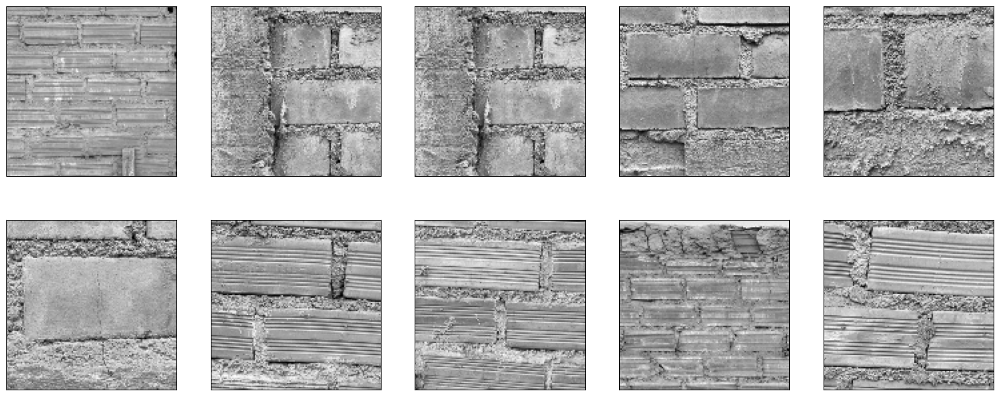

In [ ]:
#ver las imagenes de la variable X sin modificaciones por aumento de datos
plt.figure(figsize=(20, 8))
for i in range(10):
  plt.subplot(2, 5, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(X[i].reshape(ALTO, ANCHO), cmap="gray")

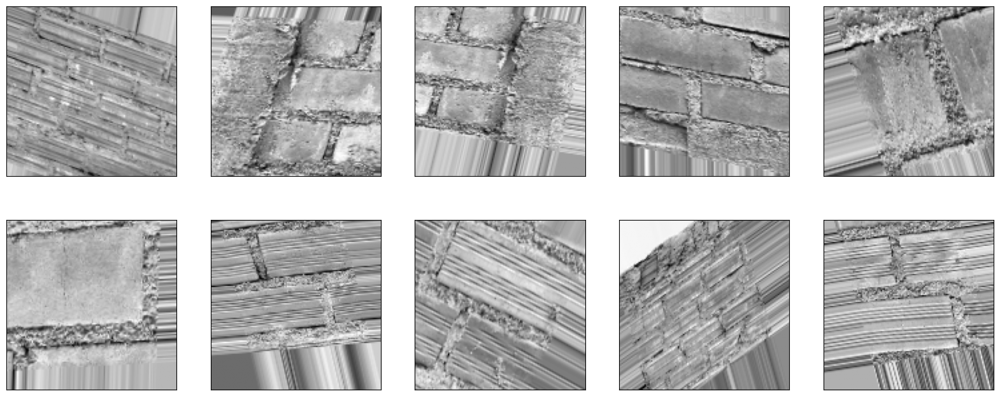

In [ ]:
#Realizar el aumento de datos con varias transformaciones. Al final, graficar 10 como ejemplo
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=15,
    zoom_range=[0.7, 1.4],
    horizontal_flip=True,
    vertical_flip=True
)

datagen.fit(X)

plt.figure(figsize=(20,8))

for imagen, etiqueta in datagen.flow(X, y, batch_size=10, shuffle=False):
  for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(imagen[i].reshape(ALTO, ANCHO), cmap="gray")
  break

# Modelo Con Aumento de Datos

In [ ]:
modeloCNN_AD = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(ALTO, ANCHO, 1)),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),

  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(100, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
modeloCNN_AD.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

In [ ]:
#Separar los datos de entrenamiento y los datos de pruebas en variables diferentes

len(X) * .85 #170
len(X) - 170 #30

X_entrenamiento = X[:170]
X_validacion = X[170:]

y_entrenamiento = y[:170]
y_validacion = y[170:]

In [ ]:
#Usar la funcion flow del generador para crear un iterador que podamos enviar como entrenamiento a la funcion FIT del modelo
data_gen_entrenamiento = datagen.flow(X_entrenamiento, y_entrenamiento, batch_size=32)

In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint

tensorboardCNN_AD = TensorBoard(log_dir='logs/cnn_AD')

# Callback para guardar el mejor modelo según val_accuracy
checkpoint = ModelCheckpoint('clasificador_superficie_AD.h5',
                             monitor='val_loss',
                             save_best_only=True,
                             mode='min',
                             verbose=1)

historial2 = modeloCNN_AD.fit(
    data_gen_entrenamiento,
    epochs=150, batch_size=32,
    validation_data=(X_validacion, y_validacion),
    steps_per_epoch=int(np.ceil(len(X_entrenamiento) / float(32))),
    validation_steps=int(np.ceil(len(X_validacion) / float(32))),
    callbacks=[tensorboardCNN_AD, checkpoint]
)


Epoch 1/150


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - accuracy: 0.5073 - loss: 0.7065
Epoch 1: val_loss improved from inf to 0.69390, saving model to clasificador_superficie_AD.h5


6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 328ms/step - accuracy: 0.5018 - loss: 0.7070 - val_accuracy: 0.5000 - val_loss: 0.6939
Epoch 2/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - accuracy: 0.5155 - loss: 0.6927
Epoch 2: val_loss improved from 0.69390 to 0.69286, saving model to clasificador_superficie_AD.h5


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.5144 - loss: 0.6928 - val_accuracy: 0.5000 - val_loss: 0.6929
Epoch 3/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - accuracy: 0.5097 - loss: 0.6936
Epoch 3: val_loss improved from 0.69286 to 0.69027, saving model to clasificador_superficie_AD.h5


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5066 - loss: 0.6937 - val_accuracy: 0.5000 - val_loss: 0.6903
Epoch 4/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - accuracy: 0.6137 - loss: 0.6856
Epoch 4: val_loss improved from 0.69027 to 0.68960, saving model to clasificador_superficie_AD.h5


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - accuracy: 0.5812 - loss: 0.6895 - val_accuracy: 0.5000 - val_loss: 0.6896
Epoch 5/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - accuracy: 0.4605 - loss: 0.6952
Epoch 5: val_loss did not improve from 0.68960
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - accuracy: 0.4718 - loss: 0.6947 - val_accuracy: 0.5000 - val_loss: 0.6929
Epoch 6/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - accuracy: 0.5240 - loss: 0.6934
Epoch 6: val_loss did not improve from 0.68960
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.5037 - loss: 0.6936 - val_accuracy: 0.5667 - val_loss: 0.6907
Epoch 7/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - accuracy: 0.4910 - loss: 0.6924
Epoch 7: val_loss improved from 0.68960 to 0.67351, saving model to clasificador_superficie_AD.h5


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - accuracy: 0.4902 - loss: 0.6922 - val_accuracy: 0.5000 - val_loss: 0.6735
Epoch 8/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - accuracy: 0.5543 - loss: 0.6836
Epoch 8: val_loss did not improve from 0.67351
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - accuracy: 0.5465 - loss: 0.6843 - val_accuracy: 0.5000 - val_loss: 0.6828
Epoch 9/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - accuracy: 0.4852 - loss: 0.6773
Epoch 9: val_loss improved from 0.67351 to 0.67207, saving model to clasificador_superficie_AD.h5


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - accuracy: 0.4928 - loss: 0.6779 - val_accuracy: 0.5000 - val_loss: 0.6721
Epoch 10/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - accuracy: 0.4703 - loss: 0.6714
Epoch 10: val_loss did not improve from 0.67207
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.4838 - loss: 0.6721 - val_accuracy: 0.5000 - val_loss: 0.6742
Epoch 11/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - accuracy: 0.5033 - loss: 0.6818
Epoch 11: val_loss did not improve from 0.67207
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - accuracy: 0.5141 - loss: 0.6794 - val_accuracy: 0.5000 - val_loss: 0.6914
Epoch 12/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - accuracy: 0.5587 - loss: 0.6511
Epoch 12: val_loss did not improve from 0.67207
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - accuracy: 0.5588 - loss: 0.6568 - val_accuracy: 0.5333 - val_loss: 0.6865
Epoch 13/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - accuracy: 0.4306 - loss: 0.6762
Epoch 13: val_loss did not improve from 0.67207
6/6 ━━━━━━━━

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.5560 - loss: 0.6556 - val_accuracy: 0.5333 - val_loss: 0.6701
Epoch 115/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - accuracy: 0.5873 - loss: 0.7739
Epoch 115: val_loss did not improve from 0.67006
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - accuracy: 0.5775 - loss: 0.7535 - val_accuracy: 0.5000 - val_loss: 0.6955
Epoch 116/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - accuracy: 0.5644 - loss: 0.6782
Epoch 116: val_loss did not improve from 0.67006
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - accuracy: 0.5577 - loss: 0.6775 - val_accuracy: 0.5000 - val_loss: 0.6954
Epoch 117/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.5207 - loss: 0.6824
Epoch 117: val_loss did not improve from 0.67006
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - accuracy: 0.5232 - loss: 0.6788 - val_accuracy: 0.5000 - val_loss: 0.6953
Epoch 118/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - accuracy: 0.5606 - loss: 0.6769
Epoch 118: val_loss did not improve from 0.67006
6/6 

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - accuracy: 0.5659 - loss: 0.6543 - val_accuracy: 0.5333 - val_loss: 0.6684
Epoch 130/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - accuracy: 0.5832 - loss: 0.6344
Epoch 130: val_loss did not improve from 0.66838
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - accuracy: 0.5813 - loss: 0.6377 - val_accuracy: 0.5333 - val_loss: 0.6960
Epoch 131/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.5759 - loss: 0.6582
Epoch 131: val_loss did not improve from 0.66838
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - accuracy: 0.5710 - loss: 0.6626 - val_accuracy: 0.5000 - val_loss: 0.6951
Epoch 132/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - accuracy: 0.5156 - loss: 0.6600
Epoch 132: val_loss did not improve from 0.66838
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - accuracy: 0.5246 - loss: 0.6624 - val_accuracy: 0.5000 - val_loss: 0.6954
Epoch 133/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - accuracy: 0.5646 - loss: 0.6633
Epoch 133: val_loss did not improve from 0.66838
6/6 

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - accuracy: 0.5803 - loss: 0.6576 - val_accuracy: 0.5333 - val_loss: 0.6592
Epoch 136/150
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - accuracy: 0.6300 - loss: 0.6232
Epoch 136: val_loss improved from 0.65920 to 0.63857, saving model to clasificador_superficie_AD.h5


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - accuracy: 0.6307 - loss: 0.6236 - val_accuracy: 0.4667 - val_loss: 0.6386
Epoch 137/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - accuracy: 0.6454 - loss: 0.6327
Epoch 137: val_loss did not improve from 0.63857
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - accuracy: 0.6409 - loss: 0.6338 - val_accuracy: 0.5333 - val_loss: 0.6476
Epoch 138/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - accuracy: 0.6156 - loss: 0.6092
Epoch 138: val_loss did not improve from 0.63857
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.6145 - loss: 0.6143 - val_accuracy: 0.5000 - val_loss: 0.6429
Epoch 139/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - accuracy: 0.5366 - loss: 0.6681
Epoch 139: val_loss did not improve from 0.63857
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - accuracy: 0.5480 - loss: 0.6608 - val_accuracy: 0.5000 - val_loss: 0.7300
Epoch 140/150
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - accuracy: 0.6184 - loss: 0.6576
Epoch 140: val_loss did not improve from 0.63857
6/6 

In [ ]:
# Guarda el historial en un archivo .pkl
import pickle

with open('clasificador_superficie_AD.pkl', 'wb') as f:
    pickle.dump(historial2.history, f)

# Probando modelo

In [ ]:
def predecir_imagen_gris_memoria(img, modelo):
    ALTO = 128
    ANCHO = 128

    # Convertir a escala de grises si la imagen tiene 3 canales
    if len(img.shape) == 3 and img.shape[2] == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Redimensionar imagen
    img_resized = cv2.resize(img, (ALTO, ANCHO))

    # Mostrar imagen
    plt.imshow(img_resized, cmap='gray')
    plt.axis('off')
    plt.title("Imagen de prueba (gris)")
    plt.show()

    # Normalizar y dar forma
    img_norm = img_resized.astype(np.float32) / 255.0
    img_norm = np.expand_dims(img_norm, axis=-1)  # (H, W, 1)
    img_norm = np.expand_dims(img_norm, axis=0)   # (1, H, W, 1)

    # Predecir
    pred = modelo.predict(img_norm)[0][0]

    # Mostrar resultado
    clase = "Macizo (1)" if pred >= 0.5 else "Pandereta (0)"
    print(f"Predicción: {clase} | Confianza: {pred:.2f}")

predecir_imagen_gris_memoria(img,modelo2)

NameError: name 'img' is not defined

# Matriz de confusion

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


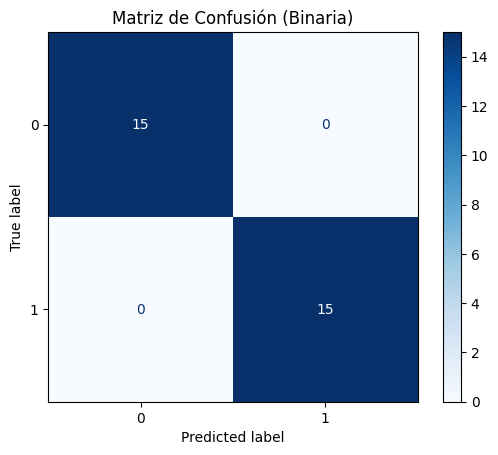

In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Obtener predicciones
y_pred_probs = modeloCNN.predict(X_validacion)
y_pred_labels = (y_pred_probs > 0.5).astype(int).flatten()

# Etiquetas verdaderas (ya están en forma 0 y 1)
y_true_labels = y_validacion

# Mostrar matriz
cm = confusion_matrix(y_true_labels, y_pred_labels)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Matriz de Confusión (Binaria)")
plt.show()



In [ ]:
!pip install tensorflowjs

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.1/89.1 kB 10.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 6.9 MB/s eta 0:00:00
  Attempting uninstall: packaging
    Found existing installation: packaging 24.2
    Uninstalling packaging-24.2:
      Successfully uninstalled packaging-24.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
db-dtypes 1.4.3 requires packaging>=24.2.0, but you have packaging 23.2 which is incompatible.
google-cloud-bigquery 3.34.0 requires packaging>=24.2.0, but you have packaging 23.2 which is incompatible.


In [ ]:
!mkdir carpeta_salida

In [ ]:
!tensorflowjs_converter --input_format keras clasificador_superficie_SA.h5 carpeta_salida

2025-06-26 09:45:42.610129: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-06-26 09:45:42.627384: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1750931142.648232   44614 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1750931142.654546   44614 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-06-26 09:45:42.675618: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr